# Train YOLO Models with Image Detect

This notebook I created to learn how to use YOLO by using fruit image. Fruit dataset that I collected from Kaggle and label via Label Studio. 

## 1. Gather and Label Training Images
Before we start training, we need to gather and label images that will be used for training the object detection model. A good starting point for a proof-of-concept model is 200 images. The training images should have random objects in the image along with the desired objects, and should have a variety of backgrounds and lighting conditions.

If we used Label Studio to label and export the images, they'll be exported in a project.zip file that contains the following:

- An images folder containing the images
- A labels folder containing the labels in YOLO annotation format
- A classes.txt labelmap file that contains all the classes
- A notes.json file that contains info specific to Label Studio (this file can be ignored)

Because label by myself, my fruit dataset is tiny. 
- Validation set = 12 images
- Training set = 48 images
- Total = 60 images → way too small for 10 classes.

Therefore, the result of performance metris confirm weak learning and bad fruit detect. Needs to improve more than 200 images that YOLO will work well. 

### Verify NVIDIA GPU Availability
Currently I run in PC with GPU working for YOLO model.

In [42]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))


True
NVIDIA GeForce RTX 4070


## 2. Upload Image Dataset and Prepare Training Data
### 2.1. Unzip the image dataset

In [9]:
import zipfile
from pathlib import Path

zip_path = "data.zip"
extract_to = "custom_data"

Path(extract_to).mkdir(parents=True, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("Unzip done")


Unzip done


### 2.2. Split images into train and validation folders

Ultralytics requires a particular folder structure to store training data for models. Ultralytics requires a particular folder structure to store training data for models. The root folder is named “data”. Inside, there are two main folders:

- Train: These are the actual images used to train the model. In one epoch of training, every image in the train set is passed into the neural network. The training algorithm adjusts the network weights to fit the data in the images.

- Validation: These images are used to check the model's performance at the end of each training epoch.

In each of these folders is a “images” folder and a “labels” folder, which hold the image files and annotation files respectively.


I wrote a Python script that will automatically create the required folder structure and randomly move 90% of dataset to the "train" folder and 10% to the "validation" folder. Run the following code block to download and execute the scrpt.

I did in terminal: 
`python train_val_split.py --datapath custom_data --train_pct 0.8`

**Results**:

Number of image files: 60

Number of annotation files: 60

Images moving to train: 48

Images moving to validation: 12



## 3. Configure Training

Before we can run training: we need to create the Ultralytics training configuration YAML file. This file specifies the location of your train and validation data, and it also defines the model's classes. 

In [28]:
from pathlib import Path
import yaml

classes_txt = Path("custom_data/classes.txt")
output_yaml = Path("data/data.yaml")

with open(classes_txt) as f:
    names = [line.strip() for line in f if line.strip()]

data = {
    "path": "data",
    "train": "train/images",
    "val": "validation/images",
    "nc": len(names),
    "names": names
}

output_yaml.parent.mkdir(parents=True, exist_ok=True)

with open(output_yaml, "w") as f:
    yaml.dump(data, f, sort_keys=False)

print("✅ data.yaml created at data/data.yaml")
print(data)


✅ data.yaml created at data/data.yaml
{'path': 'data', 'train': 'train/images', 'val': 'validation/images', 'nc': 10, 'names': ['Apple', 'Banana', 'Grapes', 'Guava', 'Hog Plum', 'Jackfruit', 'Litchi', 'Mango', 'Orange', 'Papaya']}


## 4. Train Model

Now that the data is organized and the config file is created, we're ready to start training! 

1. Model architecture & size (model):

We can train YOLOv8 or YOLOv5 models by substituting yolo11 for yolov8 or yolov5.

2. Number of epochs (epochs)

In machine learning, one “epoch” is one single pass through the full training dataset. Setting the number of epochs dictates how long the model will train for. The best amount of epochs to use depends on the size of the dataset and the model architecture. If your dataset has less than 200 images, a good starting point is 60 epochs. If your dataset has more than 200 images, a good starting point is 40 epochs.

3. Resolution (imgsz)

Resolution has a large impact on the speed and accuracy of the model: a lower resolution model will have higher speed but less accuracy. YOLO models are typically trained and inferenced at a 640x640 resolution. However, if you want your model to run faster or know you will be working with low-resolution images, try using a lower resolution like 480x480.

In [29]:
from ultralytics import YOLO
model = YOLO("yolov8n.pt")
model.train(data="data/data.yaml", epochs=60, imgsz=640, batch=16, device=0) 

Ultralytics 8.3.240  Python-3.10.19 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000235D47FBC40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047

## 5. Test model

The model has been trained; now it's time to test it! The commands below run the model on the images in the validation folder and then display the results for the first 10 images. 

In [30]:
from ultralytics import YOLO

model = YOLO("runs/detect/train/weights/best.pt")
results = model.predict(
    source="data/validation/images",
    save=True,
    device=0
)

print("Done! Check runs/detect/predict")



image 1/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\2a435d41-01__Apple.jpg: 384x640 2 Apples, 35.2ms
image 2/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\309b8e6c-04_Grapes.jpg: 384x640 (no detections), 24.7ms
image 3/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\8ac9a99b-05_Jackfruit.jpg: 544x640 1 Guava, 3 Jackfruits, 30.8ms
image 4/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\981f95c0-01_Papaya.jpeg: 448x640 1 Jackfruit, 1 Mango, 1 Orange, 27.8ms
image 5/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\a08c52d7-02_Orange.jpeg: 448x640 1 Litchi, 12.5ms
image 6/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\a1ab95b2-03_Guava.jpg: 640x512 2 Guavas, 30.3ms
image 7/12 c:\Users\teunm\OneDrive\Desktop\Suemy\TestinYOLO\data\validation\images\a36d9cd0-03_Mango.jpg: 320x640 1 Mango, 30.3ms
image 8/12 c:\Users\teunm\OneDr

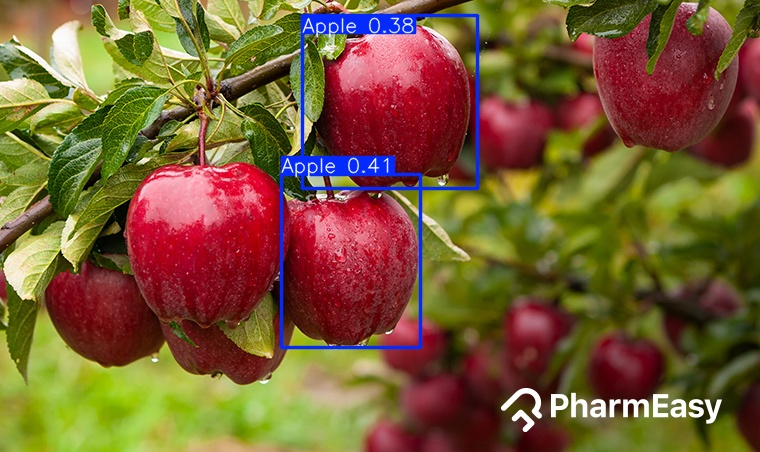

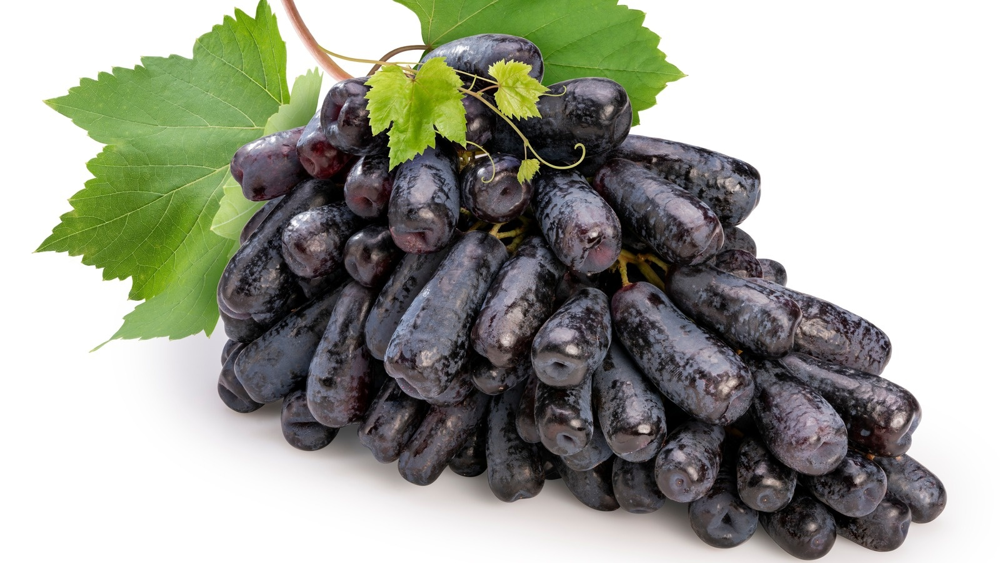

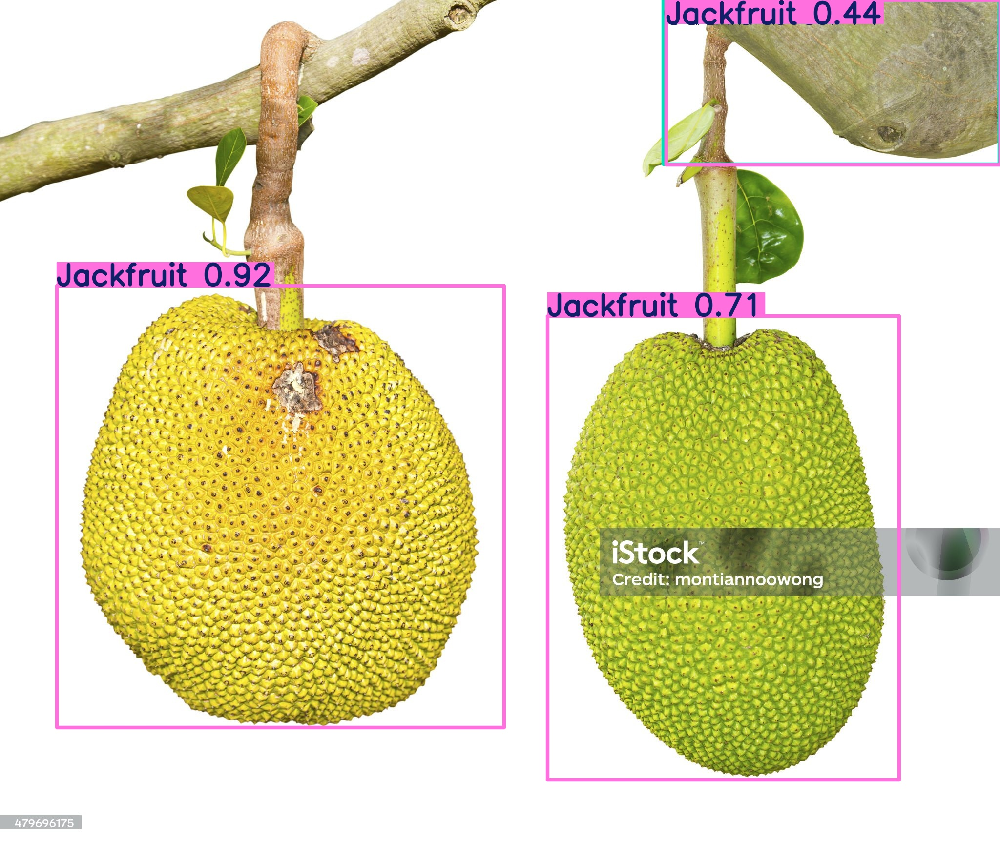

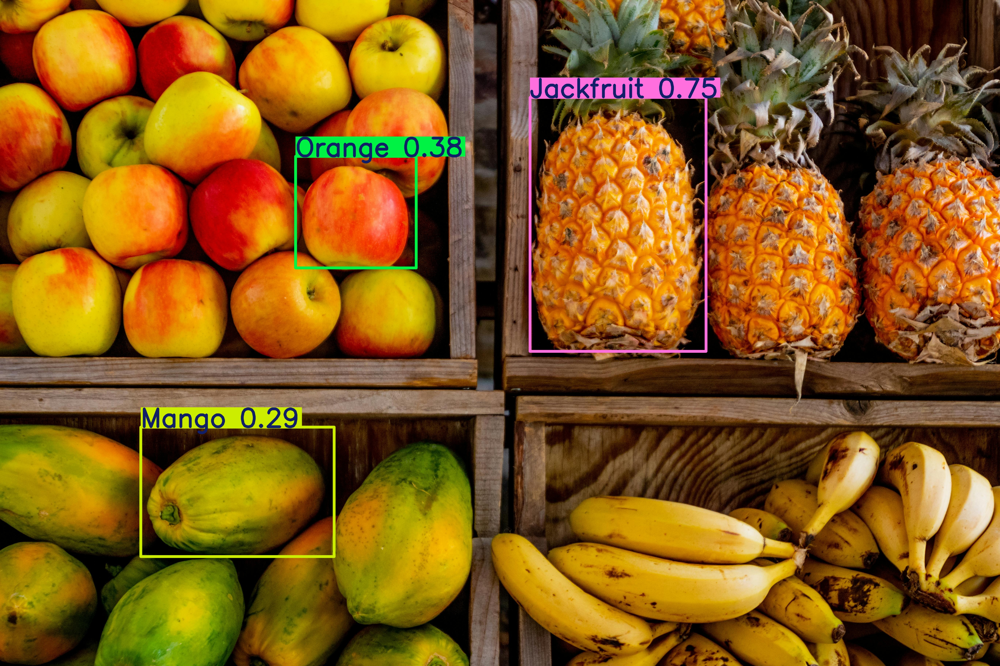

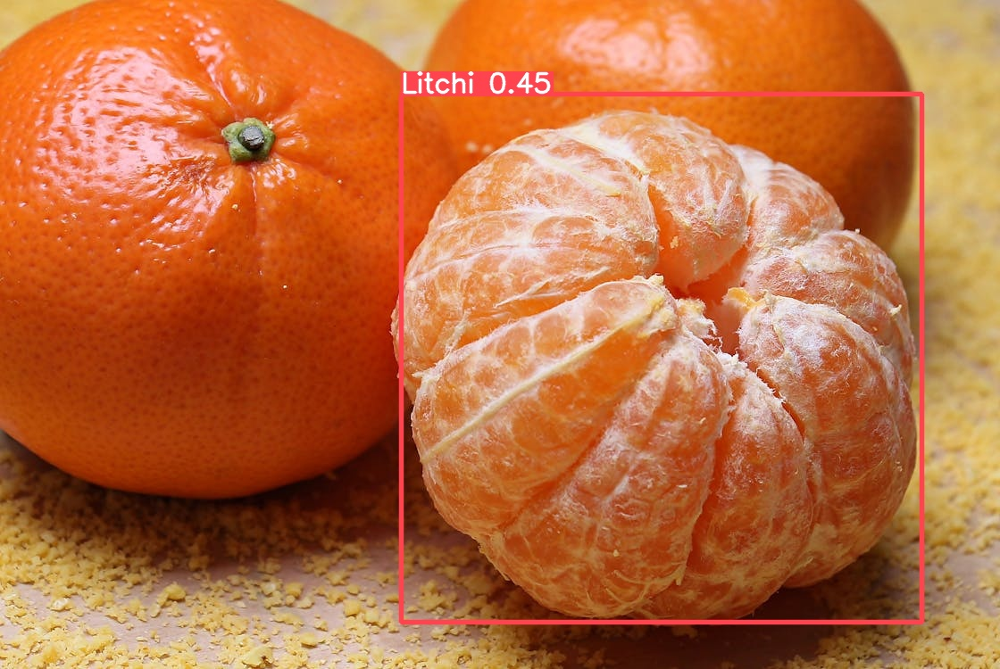

...

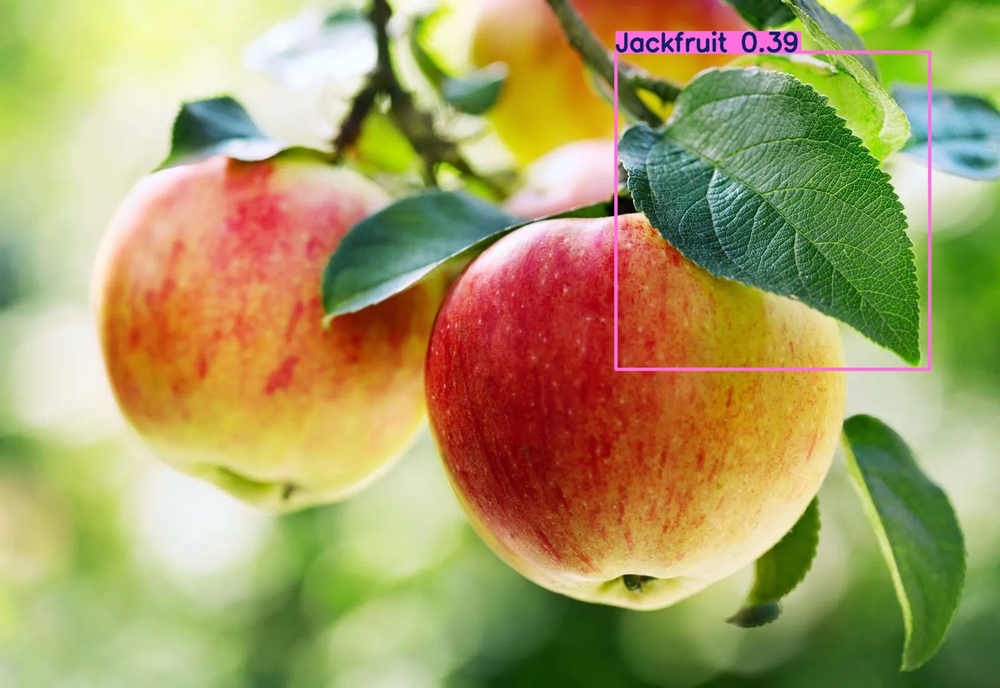

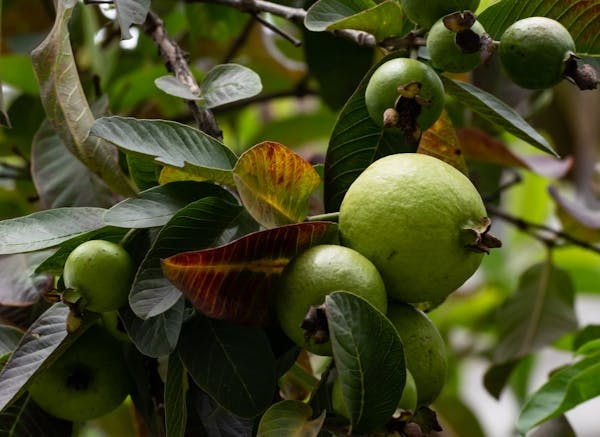

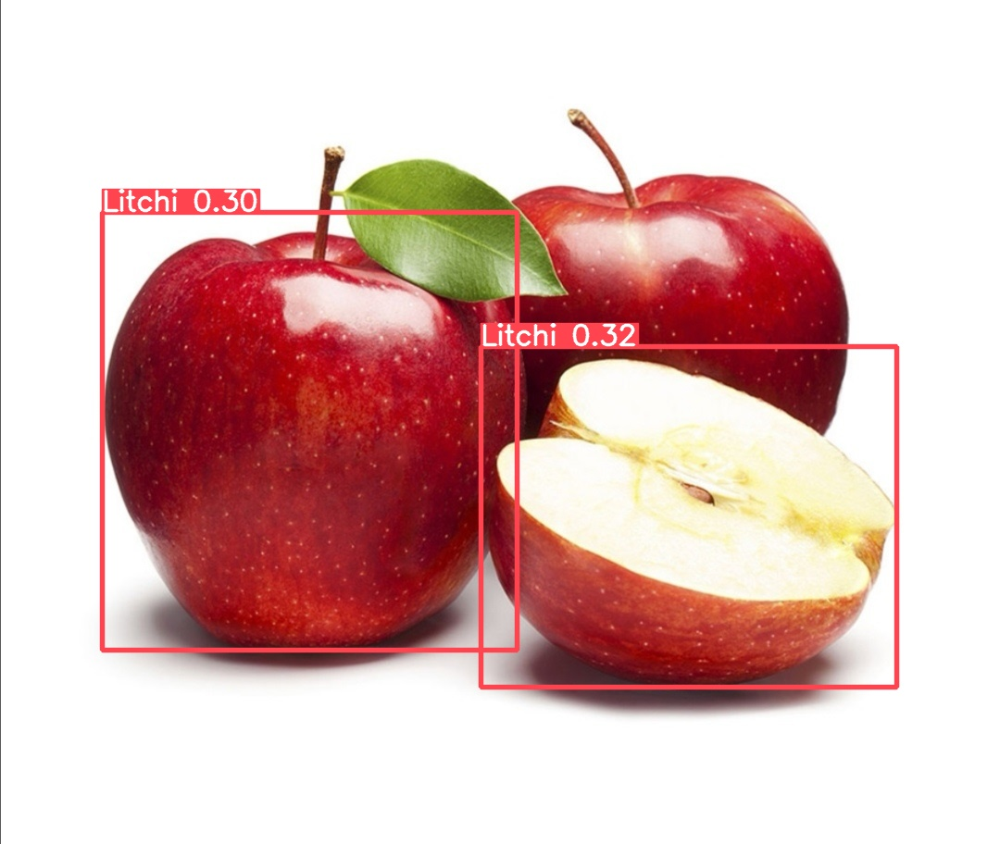

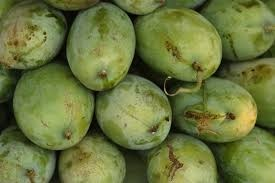

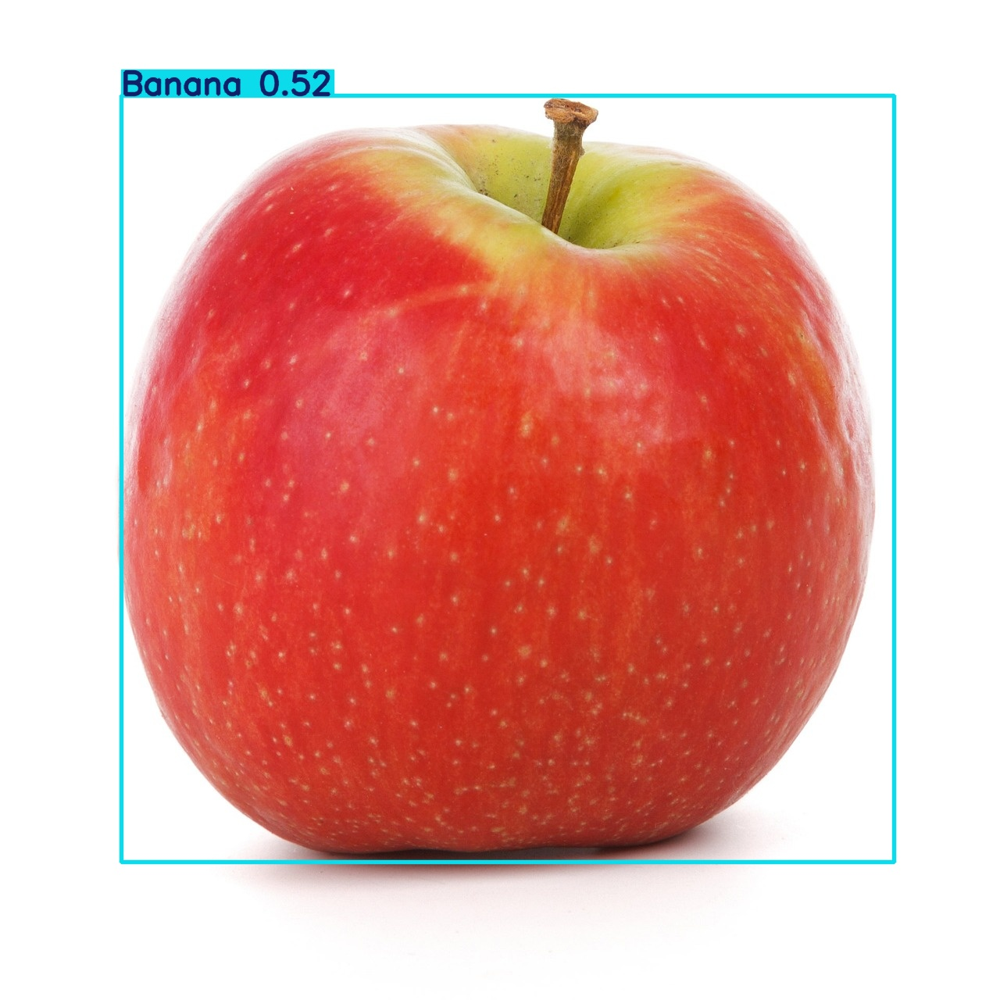

In [41]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('runs/detect/predict/*.jpg')[:20]:
    display(Image(filename=image_path, height=400))
    print('\n')
